In [1]:
#Importing the Libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#Turning off the warnings
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import plotly.express as px

In [2]:
"""CAM - Central attacking midfielder
CB - Centre back
CDM - Central defensive midfielder
CF - Center forward
CM - Centre midfielder
GK - Goalkeeper
LB - Left back
LM - Left midfielder
LW - Left winger (typically more attack-minded than a left midfielder)
RB - Right back
RM - Right midfielder
RW - Right winger (a more attacking option than a right midfielder)
ST - Striker"""

'CAM - Central attacking midfielder\nCB - Centre back\nCDM - Central defensive midfielder\nCF - Center forward\nCM - Centre midfielder\nGK - Goalkeeper\nLB - Left back\nLM - Left midfielder\nLW - Left winger (typically more attack-minded than a left midfielder)\nRB - Right back\nRM - Right midfielder\nRW - Right winger (a more attacking option than a right midfielder)\nST - Striker'

In [3]:
fifa2021 = pd.read_csv("fifa21_male2.csv")

In [4]:
#pd.set_option('display.max_columns',170)

In [5]:
#removing the display restrictions
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [6]:
fifa2021.head()

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [7]:
#formating the Value column
def format_money(column):
    values = []
    for value in fifa2021[column]:
        if value[-1]=='M':
            money = 1000000
            money *= float(value[1:-1])
        elif value[-1]=='K':
            money = 1000
            money *= float(value[1:-1])
        else: 
            money = 0
        values.append(money)
    return values

# formating Weight column
def format_weight():
    weights = []
    for weight in fifa2021['Weight'].fillna(''):
        if weight != '':
            weights.append(int(weight[:-3]))
        else:
            weights.append(np.nan)
    return weights

# formating Height Column
def format_height():
    heights = []
    for height in fifa2021['Height'].fillna(''):
        if height != '':
            height =int(height[0])*12 + int(height[2])
            heights.append(height)
        else:
            heights.append(np.nan)
    return heights

# # formating Release Clause

def format_release_clause():
    release_clause = []
    for clause in fifa2021['Release Clause'].fillna(''):
        if clause == '':
            money=0.0
        elif clause[-1]=='M':
            money = 1000000
            money *= float(clause[1:-1])
        elif clause[-1]=='K':
            money = 1000
            money *= float(clause[1:-1])
        else: 
            money = 0
        release_clause.append(money)
    return release_clause

In [8]:
#running the functions to actually alter the values in the columns
fifa2021['Value'] =  format_money('Value')
fifa2021['Wage'] = format_money('Wage')
fifa2021['Weight'] = format_weight()
fifa2021['Height'] = format_height()
fifa2021['Release Clause'] = format_release_clause()

In [9]:
#standardize the columns
fifa2021.columns = [column.lower().replace(' ', '_') for column in fifa2021.columns]

In [10]:
fifa2021.head()

,id,name,age,ova,nationality,club,bov,bp,position,player_photo,club_logo,flag_photo,pot,team_&_contract,height,weight,foot,growth,joined,loan_date_end,value,wage,release_clause,contract,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,72,181,Left,0,"Jul 1, 2008",NaN,625000.0,7000.0,0.0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,61,143,Right,0,"Jul 19, 2014",NaN,600000.0,7000.0,1100000.0,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,69,161,Right,0,"Jan 7, 2016",NaN,1100000.0,15000.0,0.0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,61,165,Right,14,NaN,NaN,0.0,0.0,0.0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,67,150,Right,0,"Jul 16, 2018",NaN,5500000.0,12000.0,7200000.0,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [11]:
fifa2021.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17125 entries, 0 to 17124
Columns: 107 entries, id to gender
dtypes: float64(13), int64(47), object(47)
memory usage: 14.0+ MB


In [12]:
fifa2021.shape 

(17125, 107)

In [13]:
# ControlN is the id, unique, so I passed it as the index
fifa2021 = fifa2021.set_index('id')

In [14]:
fifa2021.head()

,name,age,ova,nationality,club,bov,bp,position,player_photo,club_logo,flag_photo,pot,team_&_contract,height,weight,foot,growth,joined,loan_date_end,value,wage,release_clause,contract,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,gender
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,72,181,Left,0,"Jul 1, 2008",NaN,625000.0,7000.0,0.0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,61,143,Right,0,"Jul 19, 2014",NaN,600000.0,7000.0,1100000.0,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,69,161,Right,0,"Jan 7, 2016",NaN,1100000.0,15000.0,0.0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,61,165,Right,14,NaN,NaN,0.0,0.0,0.0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,67,150,Right,0,"Jul 16, 2018",NaN,5500000.0,12000.0,7200000.0,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [15]:
fifa2021.dtypes

name                 object
age                   int64
ova                   int64
nationality          object
club                 object
bov                   int64
bp                   object
position             object
player_photo         object
club_logo            object
flag_photo           object
pot                   int64
team_&_contract      object
height                int64
weight                int64
foot                 object
growth                int64
joined               object
loan_date_end        object
value               float64
wage                float64
release_clause      float64
contract             object
attacking             int64
crossing              int64
finishing             int64
heading_accuracy      int64
short_passing         int64
volleys             float64
skill                 int64
dribbling             int64
curve               float64
fk_accuracy           int64
long_passing          int64
ball_control          int64
movement            

In [16]:
fifa2021.columns.values

array(['name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'player_photo', 'club_logo', 'flag_photo', 'pot',
       'team_&_contract', 'height', 'weight', 'foot', 'growth', 'joined',
       'loan_date_end', 'value', 'wage', 'release_clause', 'contract',
       'attacking', 'crossing', 'finishing', 'heading_accuracy',
       'short_passing', 'volleys', 'skill', 'dribbling', 'curve',
       'fk_accuracy', 'long_passing', 'ball_control', 'movement',
       'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance',
       'power', 'shot_power', 'jumping', 'stamina', 'strength',
       'long_shots', 'mentality', 'aggression', 'interceptions',
       'positioning', 'vision', 'penalties', 'composure', 'defending',
       'marking', 'standing_tackle', 'sliding_tackle', 'goalkeeping',
       'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning',
       'gk_reflexes', 'total_stats', 'base_stats', 'w/f', 'sm', 'a/w',
       'd/w', 'ir', 'pac', 'sho', 'pas', '

In [17]:
fifa2021 = fifa2021.drop(['flag_photo', 'player_photo', 'club_logo', 'team_&_contract', 'foot', 'growth', 'joined',
       'loan_date_end','gender'], axis=1)

In [18]:
fifa2021.columns.values

array(['name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'pot', 'height', 'weight', 'value', 'wage',
       'release_clause', 'contract', 'attacking', 'crossing', 'finishing',
       'heading_accuracy', 'short_passing', 'volleys', 'skill',
       'dribbling', 'curve', 'fk_accuracy', 'long_passing',
       'ball_control', 'movement', 'acceleration', 'sprint_speed',
       'agility', 'reactions', 'balance', 'power', 'shot_power',
       'jumping', 'stamina', 'strength', 'long_shots', 'mentality',
       'aggression', 'interceptions', 'positioning', 'vision',
       'penalties', 'composure', 'defending', 'marking',
       'standing_tackle', 'sliding_tackle', 'goalkeeping', 'gk_diving',
       'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes',
       'total_stats', 'base_stats', 'w/f', 'sm', 'a/w', 'd/w', 'ir',
       'pac', 'sho', 'pas', 'dri', 'def', 'phy', 'hits', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm

In [19]:
fifa2021.shape 

(17125, 97)

In [20]:
fifa2021.describe() 

,age,ova,bov,pot,height,weight,value,wage,release_clause,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,pac,sho,pas,dri,def,phy
count,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,1.712500e+04,17125.000000,1.712500e+04,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17067.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17118.000000,17118.000000,17067.000000,17125.000000,16702.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000
mean,25.272934,66.965022,67.900204,72.489810,68.941664,165.658861,2.567377e+06,10436.963504,4.574445e+06,258.537752,51.621314,47.956672,53.598832,60.507620,45.005742,266.607591,57.846423,49.574676,44.387270,54.324321,60.642803,322.693664,65.445898,65.443036,64.602273,62.924847,64.715591,302.414774,59.711416,65.170212,63.309606,65.308555,49.135708,261.922803,56.997839,47.085582,52.372766,55.443605,50.251445,59.940965,141.469898,47.246949,48.279358,46.099725,77.609693,15.600467,15.484672,15.472058,15.514277,15.738628,1631.256175,361.372146,68.091620,54.967299,58.926540,64.209869,50.266102,64.910715
std,4.942665,6.864329,6.637538,5.769949,5.344764,15.818185,5.372622e+06,21191.481943,1.033846e+07,72.255687,17.875715,19.391547,16.947164,13.960635,17.729483,76.809344,18.047250,18.188344,17.504128,14.856911,15.873647,54.933593,14.657889,14.437377,14.372443,9.037279,14.031563,49.380576,13.417931,11.918063,15.313272,12.627212,19.044862,62.913935,17.021619,20.846705,19.094432,13.730080,15.696363,11.751111,61.595180,20.182548,21.483597,21.185154,81.136603,16.828637,16.143679,15.997328,16.406064,17.130908,260.357024,40.252290,11.147116,13.877605,10.186728,9.832734,16.853801,9.660260
min,16.000000,38.000000,42.000000,47.000000,61.000000,110.000000,0.000000e+00,0.000000,0.000000e+00,33.000000,6.000000,3.000000,5.000000,7.000000,4.000000,43.000000,5.000000,4.000000,5.000000,9.000000,5.000000,113.000000,12.000000,11.000000,14.000000,24.000000,17.000000,128.000000,12.000000,22.000000,11.000000,16.000000,4.000000,50.000000,9.000000,4.000000,2.000000,10.000000,7.000000,12.000000,17.000000,3.000000,5.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,731.000000,228.000000,25.000000,16.000000,25.000000,28.000000,12.000000,27.000000
25%,21.000000,62.000000,64.000000,69.000000,61.000000,154.000000,3.750000e+05,1000.000000,5.080000e+05,232.000000,41.000000,33.000000,46.000000,56.000000,32.000000,232.000000,53.000000,37.000000,32.000000,45.000000,57.000000,294.000000,58.000000,59.000000,57.000000,57.000000,57.000000,272.000000,50.000000,58.000000,56.000000,58.000000,35.000000,235.000000,45.000000,26.000000,43.000000,47.000000,40.000000,53.000000,84.000000,29.000000,28.000000,25.000000,48.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1492.000000,333.000000,62.000000,46.000000,52.000000,59.000000,35.000000,59.000000
50%,25.000000,67.000000,68.000000,72.000000,69.000000,165.000000,8.000000e+05,3000.000000,1.300000e+06,271.000000,56.000000,52.000000,57.000000,63.000000,46.000000,279.000000,63.000000,51.000000,43.000000,57.000000,64.000000,331.000000,68.000000,68.000000,67.000000,63.000000,67.000000,308.000000,61.000000,66.000000,66.000000,67.000000,53.000

In [21]:
fifa2021.corr()

,age,ova,bov,pot,height,weight,value,wage,release_clause,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,pac,sho,pas,dri,def,phy
age,1.000000,0.517099,0.456734,-0.237619,0.067408,0.258682,0.095981,0.203035,0.075386,0.183954,0.151022,0.105311,0.172793,0.176786,0.187794,0.168876,0.039607,0.181021,0.223884,0.223088,0.121097,-0.055642,-0.186610,-0.180717,-0.041488,0.501010,-0.085861,0.310459,0.304947,0.197371,0.069741,0.350439,0.190803,0.272976,0.276063,0.192996,0.122566,0.236343,0.198917,0.421126,0.114796,0.155497,0.106178,0.086021,0.125933,0.120891,0.125251,0.130810,0.134369,0.121822,0.280383,0.414897,-0.177291,0.309438,0.396082,0.241027,0.223184,0.436462
ova,0.517099,1.000000,0.985877,0.592268,0.027906,0.151834,0.631679,0.595568,0.597617,0.431238,0.386334,0.304012,0.305553,0.492372,0.362712,0.441689,0.350249,0.399299,0.369278,0.482655,0.431284,0.302267,0.143928,0.153476,0.227253,0.870084,0.100938,0.546417,0.534829,0.259915,0.335108,0.338347,0.390849,0.495097,0.382813,0.305286,0.339838,0.507683,0.317666,0.706141,0.248247,0.290071,0.237478,0.209961,0.038222,0.037851,0.037993,0.038650,0.044653,0.037284,0.607676,0.832618,0.201319,0.487060,0.699229,0.643427,0.344906,0.543354
bov,0.456734,0.985877,1.000000,0.628323,0.020761,0.132560,0.640818,0.595060,0.608384,0.464329,0.400046,0.336488,0.335677,0.533046,0.388301,0.473888,0.388163,0.419413,0.387289,0.515422,0.471454,0.335011,0.179547,0.189491,0.256046,0.870157,0.128361,0.572275,0.550932,0.264297,0.368788,0.335436,0.419660,0.523526,0.400031,0.320034,0.368287,0.530160,0.340311,0.721989,0.267770,0.309674,0.257583,0.228406,-0.008702,-0.008851,-0.008312,-0.006124,-0.000933,-0.008819,0.635037,0.830127,0.212889,0.478573,0.689975,0.640746,0.349906,0.535579
pot,-0.237619,0.592268,0.628323,1.000000,0.000872,-0.039809,0.563570,0.462596,0.549201,0.233866,0.210944,0.173281,0.137199,0.318544,0.177787,0.265503,0.264651,0.221502,0.166233,0.283647,0.292414,0.258243,0.197884,0.197396,0.190508,0.471139,0.132298,0.221586,0.266902,0.076414,0.170122,0.030991,0.191780,0.243646,0.139444,0.143810,0.191976,0.306404,0.147044,0.369826,0.138748,0.147320,0.138787,0.129735,-0.007277,-0.005874,-0.005240,-0.002734,-0.004015,-0.005215,0.329178,0.474763,0.259294,0.244481,0.395773,0.445004,0.170562,0.159959
height,0.067408,0.027906,0.020761,0.000872,1.000000,0.509748,0.006218,0.016724,0.006712,-0.302467,-0.407828,-0.292667,0.003434,-0.288981,-0.277786,-0.367327,-0.390358,-0.356583,-0.320903,-0.254920,-0.333610,-0.470089,-0.422569,-0.355871,-0.472369,-0.004854,-0.548305,-0.143235,-0.139374,-0.005301,-0.244175,0.349361,-0.304802,-0.262696,-0.039312,-0.052342,-0.354896,-0.290900,-0.254654,-0.120232,-0.061255,-0.057965,-0.057684,-0.064350,0.290178,0.287346,0.286618,0.277338,0.287007,0.287657,-0.306203,-0.110162,-0.280005,-0.071968,-0.162048,-0.229319,0.052625,0.279944
weight,0.258682,0.151834,0.132560,-0.039809,0.509748,1.000000,0.040257,0.069180,0.034724,-0.258559,-0.394283,-0.270512,0.090842,-0.266584,-0.235835,-0.355846,-0.402090,-0.341532,-0.296945,-0.235302,-0.324340,-0.537899,-0.496165,-0.410374,-0.558714,0.115521,-0.663712,0.001110,-0.044814,0.079657,-0.218123,0.644488,-0.264005,-0.202414,0.058685,-0.012939,-0.331445,-0.273528,-0.211269,-0.044473,-0.039581,-0.026690,-0.038175,-0.049136,0.326939,0.322130,0.323495,0.315963,0.325101,0.323564,-0.246410,0.005923,-0.339467,0.009329,-0.099561,-0.207594,0.104569,0.536846
value,0.095981,0.631679,0.640818,0.563570,0.006218,0.040257,1.000000,0.822432,0.979295,0.289886,0.249098,0.231430,0.167476,0.327682,0.255451,0.300469,0.260361,0.274536,0.233665,0.306740,0.294168,0.263764

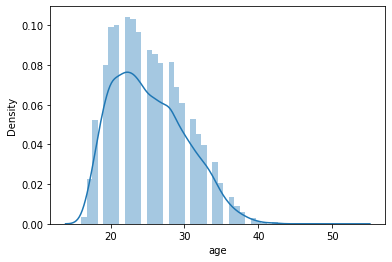

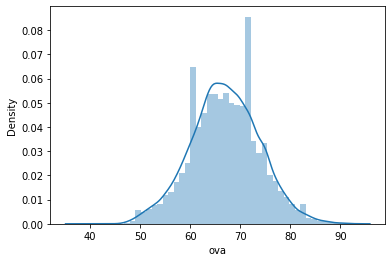

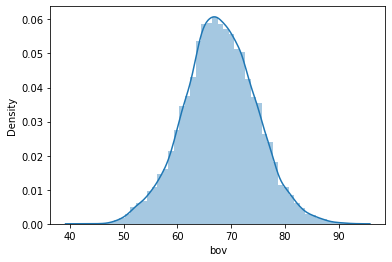

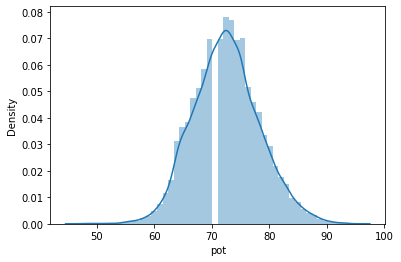

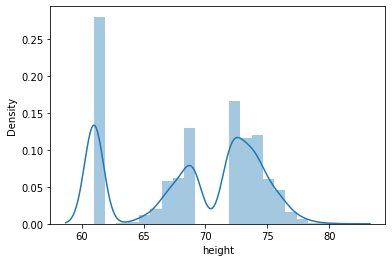

...

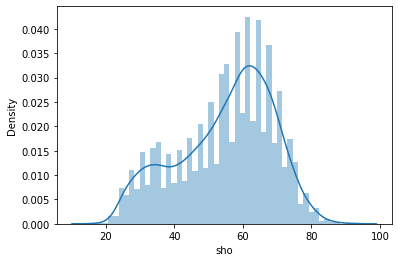

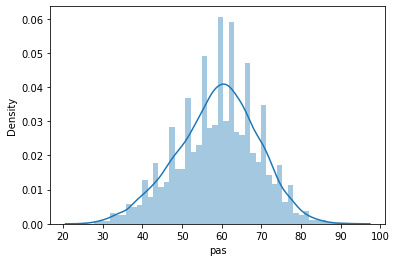

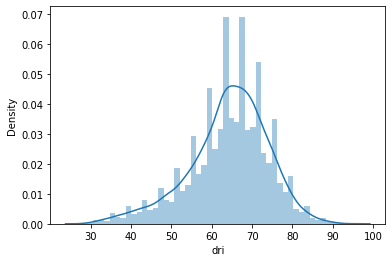

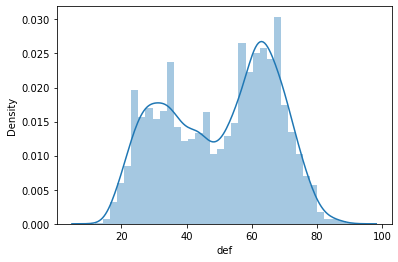

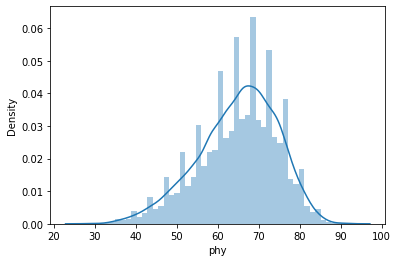

In [22]:
for column in fifa2021.select_dtypes(np.number).columns:
    sns.distplot(fifa2021[column])
    plt.show()

In [23]:
fifa2021.value.unique() #unique is the dependent variable

array([6.250e+05, 6.000e+05, 1.100e+06, 0.000e+00, 5.500e+06, 7.250e+05,
       2.800e+06, 1.000e+03, 4.000e+05, 1.200e+05, 5.000e+05, 1.900e+05,
       2.200e+06, 3.500e+05, 1.300e+06, 1.500e+06, 2.750e+05, 3.250e+05,
       9.000e+05, 8.000e+04, 3.000e+06, 3.500e+04, 9.750e+05, 4.250e+05,
       8.500e+05, 4.500e+04, 3.200e+06, 1.200e+06, 5.000e+04, 8.250e+05,
       1.300e+05, 1.800e+06, 5.750e+05, 2.100e+06, 1.600e+06, 3.750e+05,
       2.700e+06, 5.500e+05, 1.700e+06, 3.400e+06, 1.500e+05, 3.000e+05,
       4.200e+06, 5.000e+06, 1.900e+06, 6.500e+06, 8.750e+05, 1.550e+07,
       2.100e+05, 4.500e+05, 1.000e+06, 7.750e+05, 1.400e+06, 1.000e+05,
       2.400e+05, 6.500e+05, 9.500e+05, 6.000e+06, 3.900e+06, 4.600e+07,
       3.000e+04, 2.500e+06, 4.100e+06, 1.500e+04, 7.500e+06, 4.300e+06,
       2.500e+04, 9.500e+06, 3.100e+06, 9.000e+04, 2.400e+06, 6.750e+05,
       4.750e+05, 2.300e+06, 9.250e+05, 4.700e+06, 4.500e+06, 2.300e+05,
       2.000e+06, 7.000e+04, 7.000e+06, 1.700e+05, 

In [24]:
fifa2021.value.sort_values().value_counts()

1100000.0      500
0.0            457
1000000.0      347
325000.0       342
450000.0       341
1200000.0      332
275000.0       307
550000.0       299
475000.0       298
650000.0       284
525000.0       284
350000.0       283
375000.0       278
400000.0       271
300000.0       270
1300000.0      266
425000.0       259
625000.0       249
575000.0       247
800000.0       246
750000.0       242
675000.0       240
500000.0       237
5500000.0      235
1400000.0      229
600000.0       212
900000.0       206
250000.0       197
6500000.0      193
775000.0       188
1500000.0      184
925000.0       183
1800000.0      178
725000.0       174
875000.0       168
950000.0       168
8000000.0      164
850000.0       163
160000.0       154
1600000.0      147
700000.0       146
6000000.0      144
2000000.0      144
130000.0       143
2400000.0      142
170000.0       142
825000.0       142
7000000.0      138
7500000.0      133
1900000.0      132
180000.0       131
200000.0       131
8500000.0   

In [25]:
fifa2021.isnull().sum().sort_values(ascending = not True)

composure           423
position            413
a/w                  89
d/w                  89
agility              58
vision               58
balance              58
curve                58
jumping              58
sliding_tackle       58
volleys              58
club                 23
interceptions         7
positioning           7
rs                    0
pac                   0
sho                   0
pas                   0
dri                   0
def                   0
ir                    0
phy                   0
sm                    0
w/f                   0
hits                  0
ls                    0
base_stats            0
st                    0
name                  0
lf                    0
lw                    0
gk_reflexes           0
rb                    0
rcb                   0
cb                    0
lcb                   0
lb                    0
rwb                   0
rdm                   0
cdm                   0
ldm                   0
lwb             

In [26]:
fifa2021['volleys'].replace({np.NaN:fifa2021['volleys'].mean()},inplace=True)
fifa2021['curve'].replace({np.NaN:fifa2021['curve'].mean()},inplace=True)
fifa2021['agility'].replace({np.NaN:fifa2021['agility'].mean()},inplace=True)
fifa2021['balance'].replace({np.NaN:fifa2021['balance'].mean()},inplace=True)
fifa2021['jumping'].replace({np.NaN:fifa2021['jumping'].mean()},inplace=True)
fifa2021['interceptions'].replace({np.NaN:fifa2021['interceptions'].mean()},inplace=True)
fifa2021['positioning'].replace({np.NaN:fifa2021['positioning'].mean()},inplace=True)
fifa2021['composure'].replace({np.NaN:fifa2021['composure'].mean()},inplace=True)
fifa2021['sliding_tackle'].replace({np.NaN:fifa2021['sliding_tackle'].mean()},inplace=True)

In [27]:
fifa2021.isnull().sum().sort_values(ascending = not True)

position            413
a/w                  89
d/w                  89
vision               58
club                 23
ir                    0
st                    0
ls                    0
hits                  0
phy                   0
def                   0
dri                   0
pas                   0
sho                   0
pac                   0
name                  0
lw                    0
sm                    0
w/f                   0
base_stats            0
total_stats           0
gk_reflexes           0
gk_positioning        0
gk_kicking            0
gk_handling           0
rs                    0
lf                    0
goalkeeping           0
lwb                   0
rb                    0
rcb                   0
cb                    0
lcb                   0
lb                    0
rwb                   0
rdm                   0
cdm                   0
ldm                   0
rm                    0
cf                    0
rcm                   0
cm              

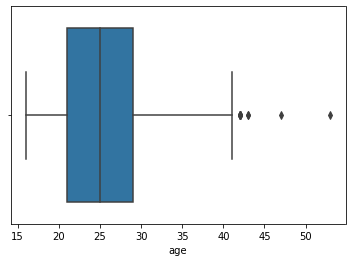

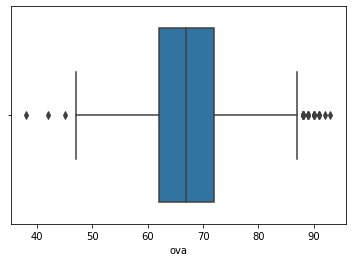

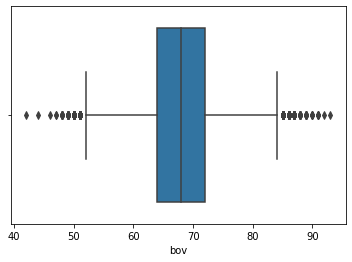

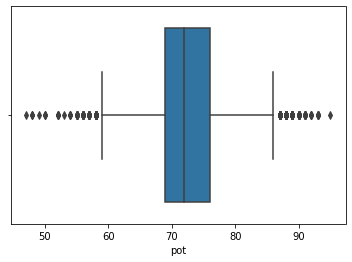

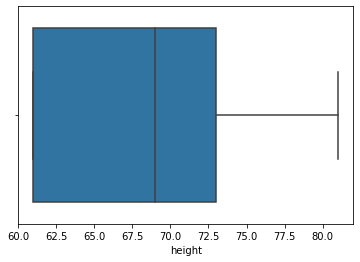

...

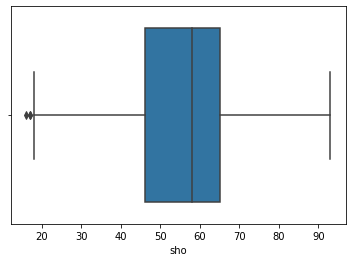

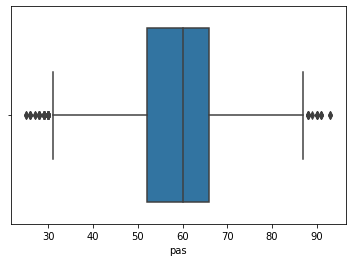

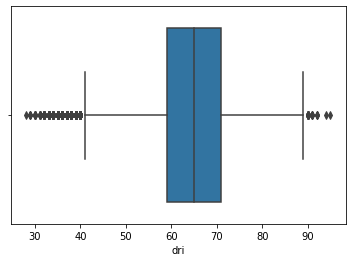

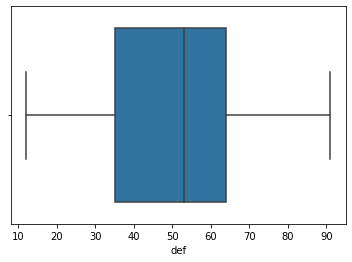

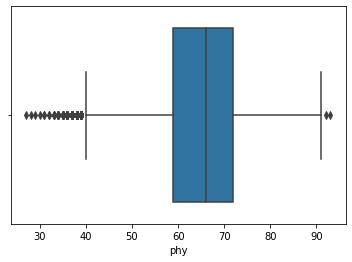

In [28]:
for column in fifa2021.select_dtypes(np.number).columns:
    sns.boxplot(fifa2021[column])
    plt.show()

In [29]:
fifa2021.name.nunique()

16176

In [30]:
#group players by club
clb_cnt=fifa2021.groupby('club').apply(lambda x:x['name'].count()).reset_index(name='Counts')
clb_cnt.sort_values(by='Counts',ascending=False,inplace=True)
fig=px.scatter(clb_cnt,x='club',y='Counts',color='Counts',title='Clubwise Player counts in FIFA 21')
fig.show()

In [31]:
#group players by position 
pos_cnt=fifa2021.groupby('bp').apply(lambda x:x['name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='bp',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

In [32]:
#age distribution (had it before also, here it looks more fancy)
age_cnt=fifa2021.groupby('age').apply(lambda x:x['name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='age',y='Counts',color='Counts',title='Agewise Player distribution in FIFA 21')
fig.show()

In [33]:
# wage compared to value
cost_prop=fifa2021[['name','club','nationality','wage','value','bp']]
cost_prop['value']=pd.to_numeric(cost_prop['value'])
cost_prop['value in €']=cost_prop['value']*cost_prop['wage']/1000000
fig=px.scatter(cost_prop,x='value',y='wage',color='value in €',size='wage',hover_data=['name','club','nationality','bp'],title='Value vs Wage Presentation of all the Players')
fig.show()

In [34]:
# best players
top_play=fifa2021[['name','ova','age','club','bp']]
top_play.sort_values(by='ova',ascending=False,inplace=True)
top_30_play=top_play[:100]
fig=px.scatter(top_30_play,x='age',y='ova',color='age',size='ova',hover_data=['name','club','bp'],title='Top Football Players in the FIFA 21 game')
fig.show()

In [35]:
# best potential (for players under 25 where potential is different than the mkt value)
cond_1=fifa2021['ova']!=fifa2021['pot']
cond_2=fifa2021['age']<25
fifa_fil=fifa2021[cond_1 & cond_2]
pot_play=fifa_fil[['name','age','nationality','club','pot','bp','ova','value','release_clause']]
pot_play.sort_values(by='pot',ascending=False,inplace=True)
top_pot_play=pot_play[:50]
fig=px.scatter(pot_play,x='age',y='pot',size='pot',color='age',hover_data=['name','age','nationality','bp','ova','value','release_clause'],title='Age vs Maximum Potential Distribution of the young Players')
fig.show()

In [36]:
#best team by potential
final_team=fifa_fil[['name','age','pot','bp','club']]
final_team.sort_values(by='age',inplace=True)
pos_play=final_team.groupby('bp').apply(lambda x:np.max(x['pot'])).reset_index(name='Potential')
player_pos=pd.merge(final_team,pos_play,how='inner',left_on=['bp','pot'],right_on=['bp','Potential'])
pos_best=player_pos[['name','club','age','bp','Potential']]
cm = sns.light_palette("black", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).set_precision(2)

,name,club,age,bp,Potential
0,Ansu Fati,FC Barcelona,17,LW,90
1,J. Doku,RSC Anderlecht,18,RW,88
2,Vinícius Jr.,Real Madrid,19,RM,93
3,A. Davies,FC Bayern München,19,LB,89
4,Reguilón,Tottenham Hotspur,23,LB,89
5,S. Tonali,Milan,20,CM,91
6,João Félix,Atlético Madrid,20,CAM,93
7,J. Sancho,Borussia Dortmund,20,CAM,93
8,K. Havertz,Chelsea,21,CAM,93
9,M. de Ligt,Juventus,20,CB,92


In [37]:
# best team in fifa
final_team=fifa2021[['name','age','ova','bp','club']]
final_team.sort_values(by='age',inplace=True)
pos_play=final_team.groupby('bp').apply(lambda x:np.max(x['ova'])).reset_index(name='Overall Score')
player_pos=pd.merge(final_team,pos_play,how='inner',left_on=['bp','ova'],right_on=['bp','Overall Score'])
pos_best=player_pos[['name','club','age','bp','Overall Score']]
cm = sns.light_palette("yellow", as_cmap=True) 
pos_best.style.background_gradient(cmap=cm).set_precision(2)

,name,club,age,bp,Overall Score
0,T. Alexander-Arnold,Liverpool,21,RB,87
1,M. Rashford,Manchester United,22,RM,85
2,S. Gnabry,FC Bayern München,24,RM,85
3,A. Robertson,Liverpool,26,LB,87
4,H. Son,Tottenham Hotspur,27,LM,87
5,J. Oblak,Atlético Madrid,27,GK,91
6,Casemiro,Real Madrid,28,CDM,89
7,V. van Dijk,Liverpool,28,CB,90
8,Neymar Jr,Paris Saint-Germain,28,LW,91
9,K. De Bruyne,Manchester City,29,CAM,91


In [38]:
#starting to set up things to try and predict value (market value)
X = fifa2021.select_dtypes(include=['float64','int64']).drop(['value'], axis=1) # watch out, rookie mistake, don't use your target to train the model
X = pd.DataFrame(X).fillna(X.mean())
#X = X.drop(['release_clause'], axis=1)

In [39]:
y = fifa2021['value'] # what we want to predict

In [40]:
#train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(X_train,y_train)

predictions  = model.predict(X_test)

In [41]:
lm = LinearRegression() # start the model object
model = lm.fit(X,y)

In [42]:
# evaluating sklearn's LR model

predictions = lm.predict(X_test) # predict some values

rmse = mean_squared_error(y_test, predictions, squared=False) # or mse with squared=True
# r2 gives you an overall estimate of how good the model is, between 0 (lowest) and 1 (highest)
# rmse, good to see if the errors are big, the values returnes are in the unit of the target
print("R2_score:", round(lm.score(X,y),2)) # or r2_score(Y, predictions)
print("RMSE:", rmse)

#0.75 if we remove release_clause

R2_score: 0.97
RMSE: 1031689.0009986153


<AxesSubplot:ylabel='value'>

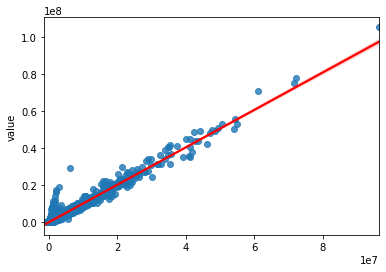

In [43]:
sns.regplot(predictions, y_test, line_kws={"color": "red"})

In [44]:
#trying new things

fifa2021_more_testing = fifa2021[['age','value', 'wage','total_stats', 'position', 'ova', 'pot']]
#fifa2021_more_testing = fifa2021[['age','value', 'wage','total_stats', 'position', 'ova', 'pot']]
#fifa2021_more_testing = fifa2021[['name', 'age','value', 'wage','total_stats', 'position', 'ova', 'pot']]
#fifa2021_more_testing = fifa2021[['name', 'age','value', 'wage','total_stats', 'height', 'weight', 'position', 'ova', 'pot']]
#fifa2021_more_testing = fifa2021[['name', 'age', 'club','nationality','value', 'wage','total_stats', 'height', 'weight', 'position', 'ova', 'pot']]

In [45]:
fifa2021_more_testing.head()

,age,value,wage,total_stats,position,ova,pot
id,,,,,,,
2,33,625000.0,7000.0,1929,LM,69,69
16,37,600000.0,7000.0,1906,CM CAM CDM,71,71
27,33,1100000.0,15000.0,1770,CAM RM RW LM,71,71
36,36,0.0,0.0,1348,NaN,68,82
41,36,5500000.0,12000.0,2014,CM CAM,81,81


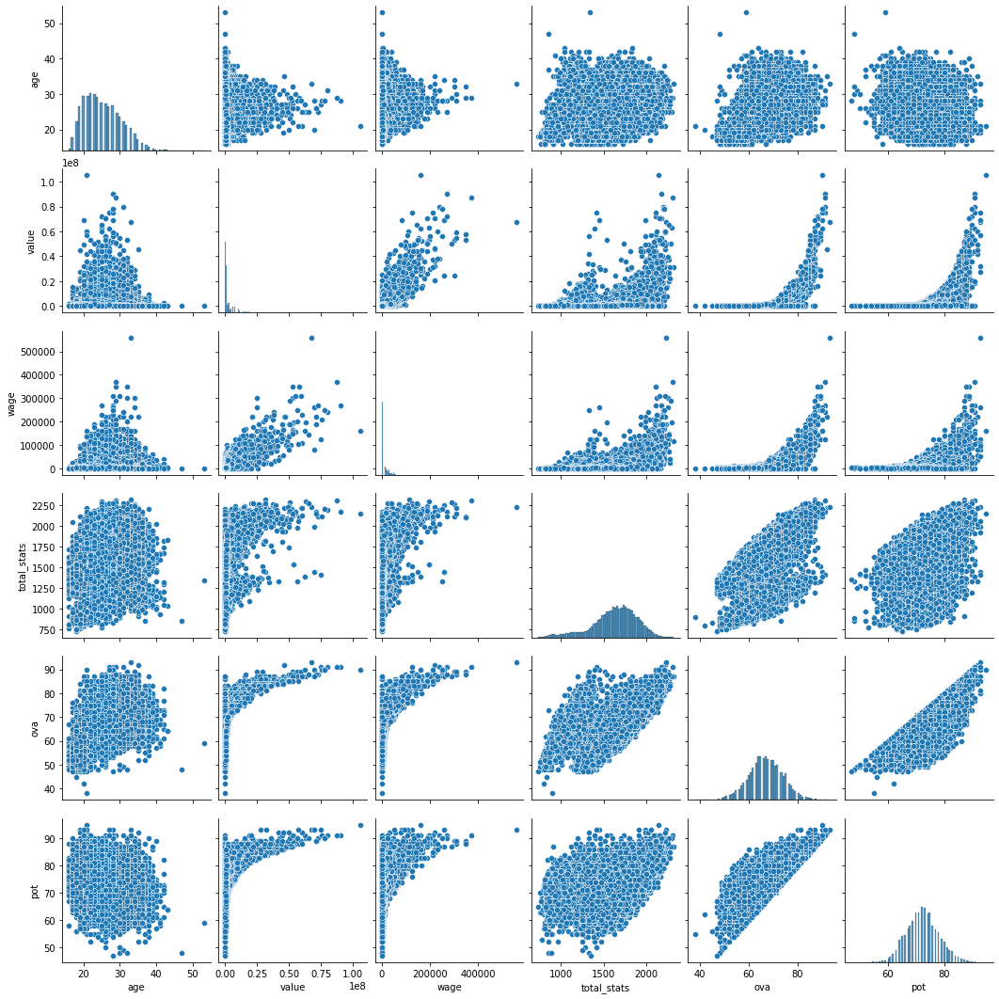

In [46]:
# covariance visualization
sns.pairplot(fifa2021_more_testing)

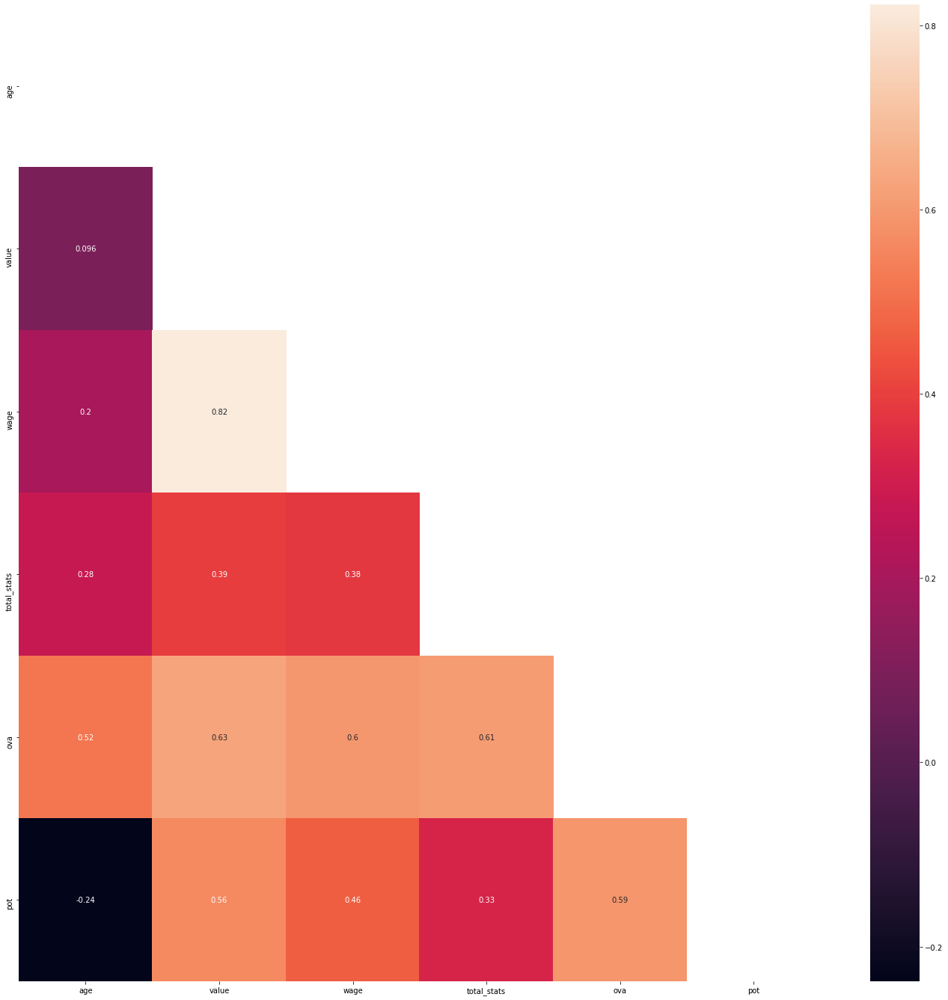

In [47]:
# check the correlations
mask = np.zeros_like(fifa2021_more_testing.corr())

mask[np.triu_indices_from(mask)] = True # optional, to hide repeat half of the matrix

fig, ax = plt.subplots(figsize=(24, 24))
ax = sns.heatmap(fifa2021_more_testing.corr(), mask=mask, annot=True)
plt.show()

In [48]:
def boxcox_transform(fifa2021_more_testing):
    numeric_cols = fifa2021_more_testing.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        # since i know any columns should take negative numbers, to avoid -inf in df
        fifa2021_more_testing[column] = np.where(fifa2021_more_testing[column]<=0, np.NAN, fifa2021_more_testing[column]) 
        fifa2021_more_testing[column] = fifa2021_more_testing[column].fillna(fifa2021_more_testing[column].mean())
        transformed_data, ci = stats.boxcox(fifa2021_more_testing[column])
        fifa2021_more_testing[column] = transformed_data
        _ci[column] = ci
    return fifa2021_more_testing, _ci

In [49]:
fifa2021_more_testing, _ci = boxcox_transform(fifa2021_more_testing)
_ci

{'age': -0.2492783223122066,
 'value': -0.06101848053221857,
 'wage': -0.06013881814718502,
 'total_stats': 2.3118960788829974,
 'ova': 0.9559340098746975,
 'pot': 0.462816532335289}

In [50]:
def remove_outliers(fifa2021_more_testing, threshold=1.5, in_columns=fifa2021_more_testing.select_dtypes(np.number).columns, skip_columns=[]):
    for column in in_columns:
        if column not in skip_columns:
            upper = np.percentile(fifa2021_more_testing[column],75)
            lower = np.percentile(fifa2021_more_testing[column],25)
            iqr = upper - lower
            upper_limit = upper + threshold * iqr
            lower_limit = lower - threshold * iqr
            fifa2021_more_testing = fifa2021_more_testing[(fifa2021_more_testing[column]>lower_limit) & (fifa2021_more_testing[column]<upper_limit)]
    return fifa2021_more_testing

In [51]:
df1 = remove_outliers(fifa2021_more_testing, threshold=2) # we don't want to reduce our data too much,
## but we can play with the parameters to see,
## so after a better analysis we can choose which columns to drop outliers or not
#df1

In [52]:
df2 = remove_outliers(df1, threshold=1.5, in_columns=['value'])
# now filter tIndexError: cannot do a non-empty take from an empty axes.he outliers on the more important columns with a tighter threshold
#df2

In [53]:
# encoding categorical
df3 = pd.get_dummies(df2, drop_first=True) # i'm lazy
#df3 = df2.drop('Club', axis=1)

In [54]:
# splitting our data

X = df3.drop('value', axis=1)
y = df3['value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [55]:
X_train.shape

(11916, 624)

In [56]:
df3.columns

Index(['age', 'value', 'wage', 'total_stats', 'ova', 'pot', 'position_CAM',
       'position_CAM CDM', 'position_CAM CDM CM', 'position_CAM CDM LM',
       ...
       'position_ST RM RB', 'position_ST RM RW', 'position_ST RM RWB',
       'position_ST RW', 'position_ST RW CAM', 'position_ST RW CAM RM',
       'position_ST RW CF', 'position_ST RW LM', 'position_ST RW LW',
       'position_ST RW RM'],
      dtype='object', length=625)

In [57]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [58]:
predictions = model.predict(X_test)

In [59]:
r2_score(y_test, predictions), mean_absolute_error(y_test, predictions), mean_squared_error(y_test, predictions, squared=False)
#if we let 'name', 'age','value', 'wage','total_stats', 'height', 'weight', 'position', 'ova', 'pot' => (-820329.147833436, 20.597642668520216, 507.6455440035687)
#fifa2021_more_testing = fifa2021[['name', 'age','value', 'wage','total_stats', 'position', 'ova', 'pot']] => (0.8820769680764409, 0.12436403537418955, 0.19075395763473413)
#fifa2021_more_testing = fifa2021[['age','value', 'wage','total_stats', 'position', 'ova', 'pot']] => (0.9169588697407761, 0.09367178456806254, 0.1600740247572928)

(0.9169588697407761, 0.09367178456806254, 0.1600740247572928)

<AxesSubplot:ylabel='value'>

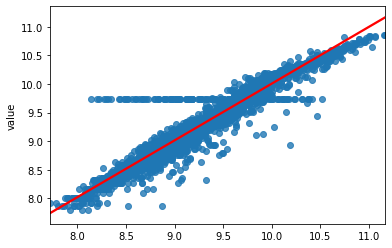

In [60]:
sns.regplot(predictions, y_test, line_kws={"color": "red"})